In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/monumentimagenotaugmented/"
x = load(os.path.join(path, 'train/Train_3221.jpg'))
print(x.shape)

(300, 300, 3)


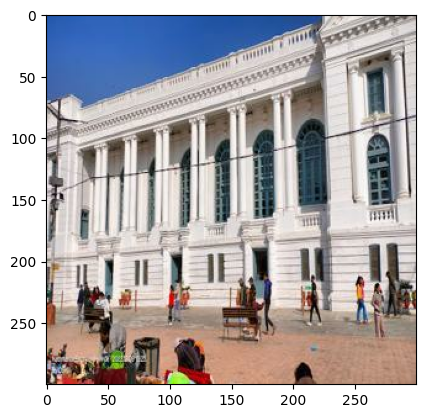

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

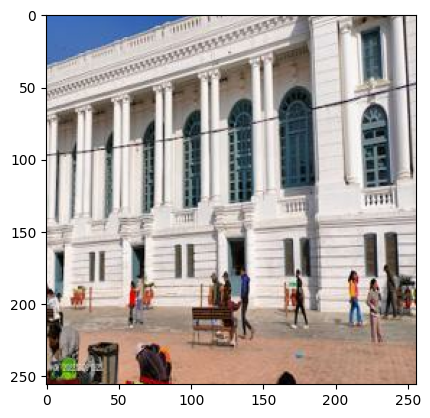

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

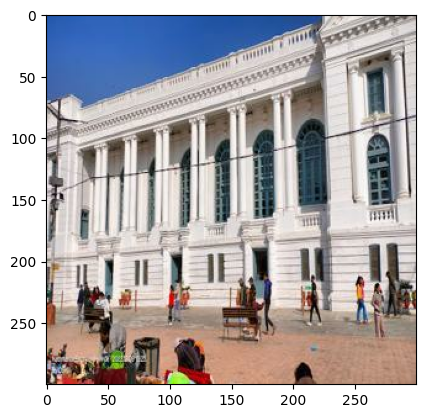

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = tf.image.random_brightness(real_image, 0.4)
    real_image = tf.image.random_saturation(real_image, 0.2,2)
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)
    real_image = tfa.image.rotate(real_image, angles=rotation_angle, fill_mode='nearest')
    real_image = random_crop(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [16]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [17]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [18]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [19]:
validation_dataset = tf.data.Dataset.list_files(path + 'val/*.jpg')
validation_dataset = validation_dataset.map(load_test_image)
validation_dataset = validation_dataset.batch(BATCH_SIZE)
validation_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [20]:
test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
test_dataset = test_dataset.map(load_test_image)
test_dataset = test_dataset.batch(1)
test_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [21]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 150, 3)


In [22]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 300, 3)


In [23]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

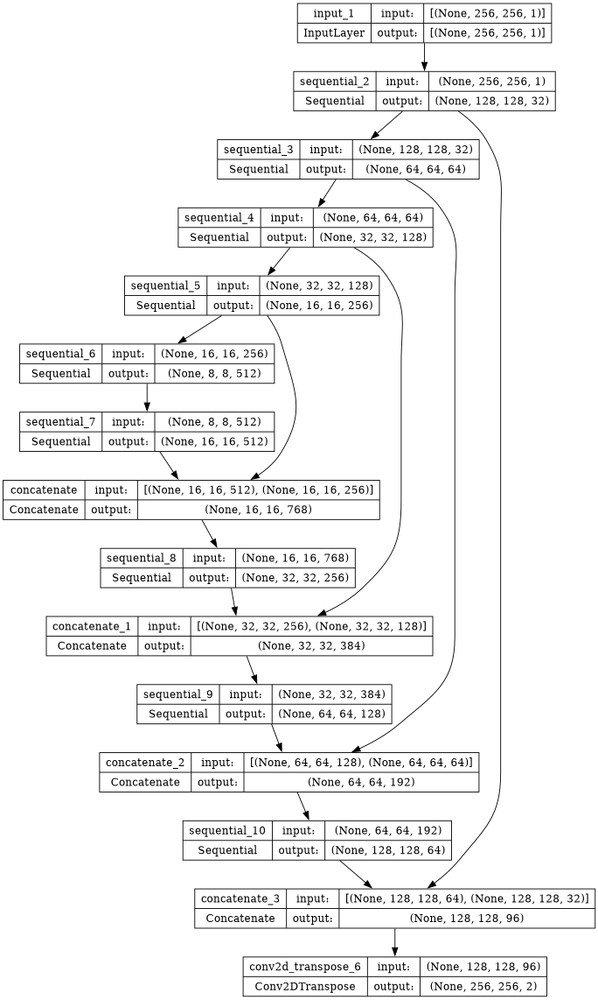

In [24]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [25]:
gen.load_weights('/kaggle/input/imgcolorizationgenanddiscmodelweight/gen_weight.keras')

In [26]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

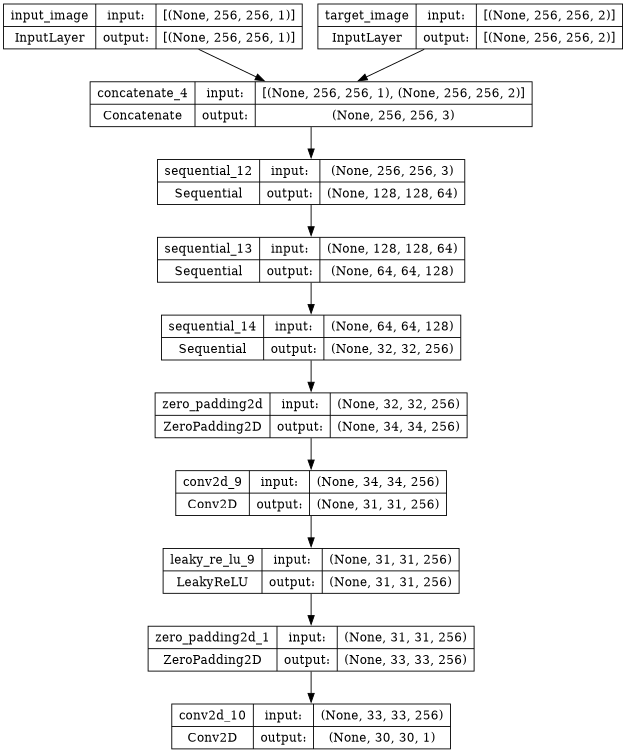

In [27]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [28]:
disc.load_weights('/kaggle/input/imgcolorizationgenanddiscmodelweight/disc_wweight.keras')

In [29]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [30]:
LAMBDA = 50

In [31]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [32]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 80*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [33]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [34]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [35]:
generator_optimizer = Adam(lr= 0.0004500000213738531, beta_1=0.5)
discriminator_optimizer = Adam(lr = 0.0003000000142492354, beta_1=0.5)

In [36]:
epochs = 250

In [37]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [38]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [39]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [40]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [41]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [42]:
os.mkdir('/kaggle/working/gen_output/')

In [43]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [44]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


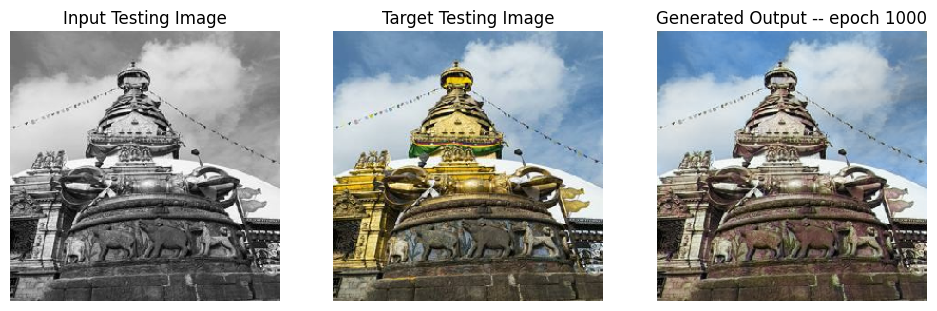

SSIM Score: 0.9696545600891113
PSNR Score: 24.95041847229004


In [45]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_498.jpg',1000)

In [46]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for i in range(epochs):
        epoch = i + 74
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),
                                       np.mean(each_epoch_train_generator_gan_losses), 
                                       np.mean(each_epoch_train_generator_l1_losses),
                                       np.mean(each_epoch_train_generator_perceptual_losses), 
                                       np.mean(each_epoch_train_discriminator_losses), 
                                       np.mean(each_epoch_train_discriminator_generated_losses), 
                                       np.mean(each_epoch_train_discriminator_real_losses), 
                                       np.mean(each_epoch_train_ssim), 
                                       np.mean(each_epoch_train_psnr), 
                                       np.mean(each_epoch_test_generator_losses),
                                       np.mean(each_epoch_test_generator_gan_losses), 
                                       np.mean(each_epoch_test_generator_l1_losses),
                                       np.mean(each_epoch_test_generator_perceptual_losses),
                                       np.mean(each_epoch_test_discriminator_losses), 
                                       np.mean(each_epoch_test_discriminator_generated_losses), 
                                       np.mean(each_epoch_test_discriminator_real_losses), 
                                       np.mean(each_epoch_test_ssim), 
                                       np.mean(each_epoch_test_psnr),
                                       generator_optimizer.learning_rate.numpy(),
                                       discriminator_optimizer.learning_rate.numpy()
                                      ])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 39000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_498.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if i > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [47]:
tf.config.run_functions_eagerly(True)

Epoch 74
80134624/80134624 [==============================] - 0s 0us/step
Training Details
Generator-- total_loss:26.85634 gan_loss:24.15164 l1_loss:0.04152 perceptual_loss:0.00786 Discriminator-- total_loss:0.15228 real_loss:0.05627 generated_loss:0.09601 --- SSIM 0.92804 PSNR 24.39101 LPIPS 0.00000
Time taken for epoch 75 is 397.6291415691376 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.36836 gan_loss:0.01385 l1_loss:0.03602  perceptual_loss:0.00692 Discriminator-- total_loss:7.63354 real_loss:7.61284 generated_loss:0.02070 --- SSIM 0.95214 PSNR 24.94445 LPIPS 0.00000
Time taken for epoch 75 is 487.21924781799316 sec
Number of iteration 140
Epoch 75
Training Details
Generator-- total_loss:25.12394 gan_loss:22.40470 l1_loss:0.04173 perceptual_loss:0.00791 Discriminator-- total_loss:0.00086 real_loss:0.00041 generated_loss:0.00046 --- SSIM 0.92721 PSNR 24.33800 LPIPS 0.00000
Time taken for epoch 76 is 398.74726152420044 sec
Number of iteration 490
Validation 

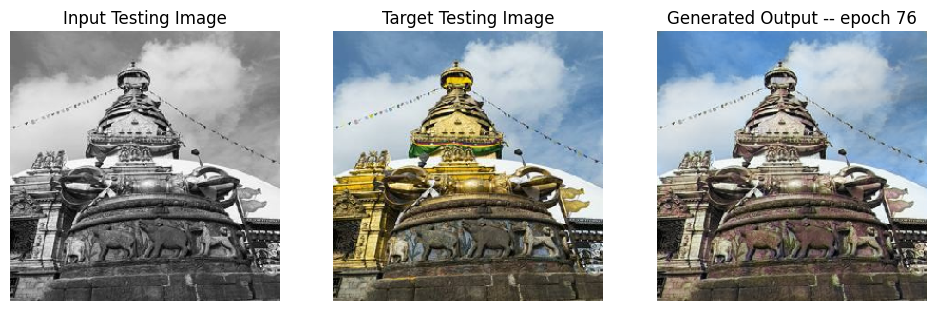

SSIM Score: 0.9687027931213379
PSNR Score: 24.835872650146484
Epoch 76
Training Details
Generator-- total_loss:25.34591 gan_loss:22.64044 l1_loss:0.04158 perceptual_loss:0.00783 Discriminator-- total_loss:0.00218 real_loss:0.00100 generated_loss:0.00118 --- SSIM 0.92798 PSNR 24.39934 LPIPS 0.00000
Time taken for epoch 77 is 404.9948387145996 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.39743 gan_loss:0.04362 l1_loss:0.03602  perceptual_loss:0.00691 Discriminator-- total_loss:6.57274 real_loss:6.50591 generated_loss:0.06683 --- SSIM 0.95212 PSNR 24.94430 LPIPS 0.00000
Time taken for epoch 77 is 499.0086407661438 sec
Number of iteration 140
Epoch 77
Training Details
Generator-- total_loss:29.65597 gan_loss:26.94570 l1_loss:0.04159 perceptual_loss:0.00789 Discriminator-- total_loss:0.25211 real_loss:0.13975 generated_loss:0.11236 --- SSIM 0.92797 PSNR 24.38588 LPIPS 0.00000
Time taken for epoch 78 is 405.52595376968384 sec
Number of iteration 490
Validation Deta

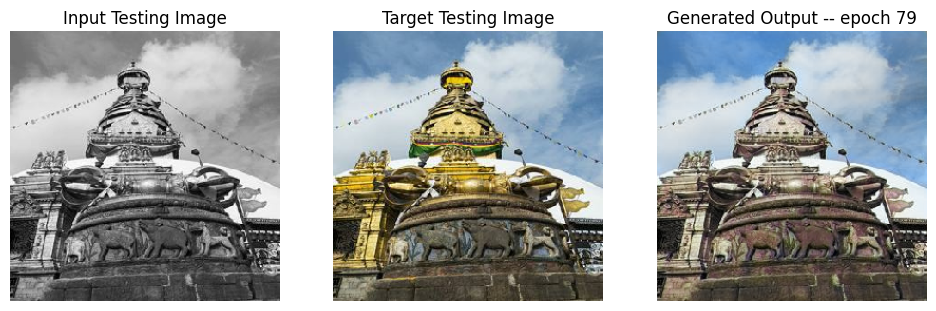

SSIM Score: 0.9687356352806091
PSNR Score: 24.83673858642578
Epoch 79
Training Details
Generator-- total_loss:29.54104 gan_loss:26.83611 l1_loss:0.04151 perceptual_loss:0.00787 Discriminator-- total_loss:0.00014 real_loss:0.00007 generated_loss:0.00007 --- SSIM 0.92853 PSNR 24.38711 LPIPS 0.00000
Time taken for epoch 80 is 405.327672958374 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.36256 gan_loss:0.00921 l1_loss:0.03601  perceptual_loss:0.00691 Discriminator-- total_loss:12.80215 real_loss:12.79275 generated_loss:0.00940 --- SSIM 0.95220 PSNR 24.94558 LPIPS 0.00000
Time taken for epoch 80 is 497.511515378952 sec
Number of iteration 140
Epoch 80
Training Details
Generator-- total_loss:29.94045 gan_loss:27.24306 l1_loss:0.04138 perceptual_loss:0.00786 Discriminator-- total_loss:0.00027 real_loss:0.00012 generated_loss:0.00016 --- SSIM 0.92841 PSNR 24.39220 LPIPS 0.00000
Time taken for epoch 81 is 408.3174753189087 sec
Number of iteration 490
Validation Detail

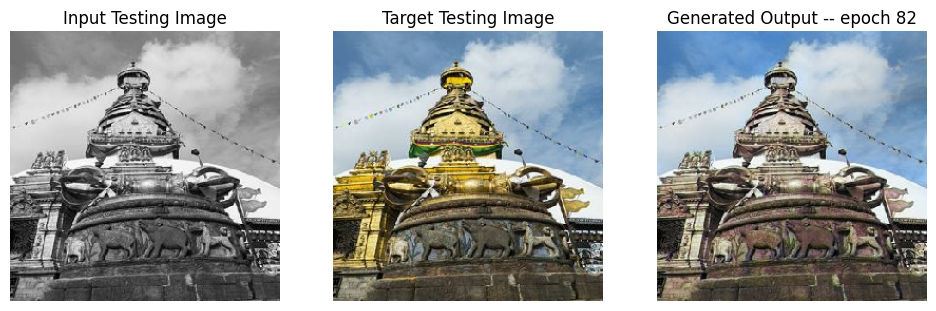

SSIM Score: 0.968721330165863
PSNR Score: 24.846954345703125
Epoch 82
Training Details
Generator-- total_loss:33.37299 gan_loss:30.68468 l1_loss:0.04131 perceptual_loss:0.00779 Discriminator-- total_loss:0.00836 real_loss:0.00438 generated_loss:0.00398 --- SSIM 0.92911 PSNR 24.42570 LPIPS 0.00000
Time taken for epoch 83 is 397.98434114456177 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.48680 gan_loss:0.13293 l1_loss:0.03602  perceptual_loss:0.00691 Discriminator-- total_loss:9.11704 real_loss:8.94774 generated_loss:0.16930 --- SSIM 0.95216 PSNR 24.94359 LPIPS 0.00000
Time taken for epoch 83 is 486.44384503364563 sec
Number of iteration 140
Epoch 83
Training Details
Generator-- total_loss:33.08252 gan_loss:30.36830 l1_loss:0.04170 perceptual_loss:0.00786 Discriminator-- total_loss:0.37592 real_loss:0.20917 generated_loss:0.16675 --- SSIM 0.92805 PSNR 24.37139 LPIPS 0.00000
Time taken for epoch 84 is 392.24243927001953 sec
Number of iteration 490
Validation Det

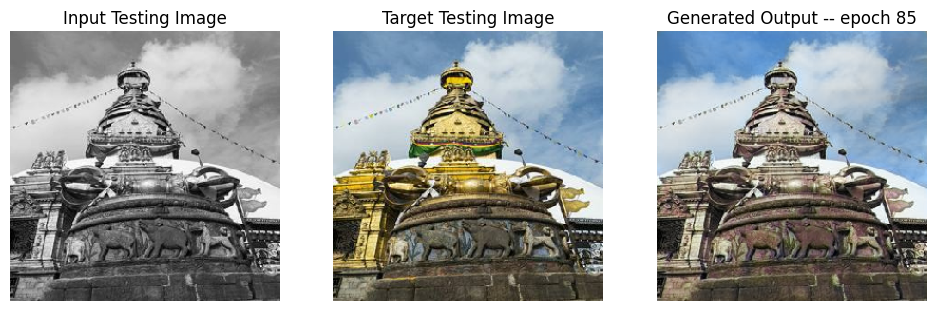

SSIM Score: 0.9686441421508789
PSNR Score: 24.838472366333008
Epoch 85
Training Details
Generator-- total_loss:33.89977 gan_loss:31.20269 l1_loss:0.04139 perceptual_loss:0.00784 Discriminator-- total_loss:0.03618 real_loss:0.01734 generated_loss:0.01884 --- SSIM 0.92855 PSNR 24.40827 LPIPS 0.00000
Time taken for epoch 86 is 403.11996579170227 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.42247 gan_loss:0.07034 l1_loss:0.03600  perceptual_loss:0.00690 Discriminator-- total_loss:14.21171 real_loss:14.11208 generated_loss:0.09963 --- SSIM 0.95218 PSNR 24.95027 LPIPS 0.00000
Time taken for epoch 86 is 494.8697452545166 sec
Number of iteration 140
Epoch 86
Training Details
Generator-- total_loss:35.13315 gan_loss:32.41748 l1_loss:0.04166 perceptual_loss:0.00791 Discriminator-- total_loss:0.00061 real_loss:0.00031 generated_loss:0.00030 --- SSIM 0.92769 PSNR 24.36709 LPIPS 0.00000
Time taken for epoch 87 is 411.52933502197266 sec
Number of iteration 490
Validation D

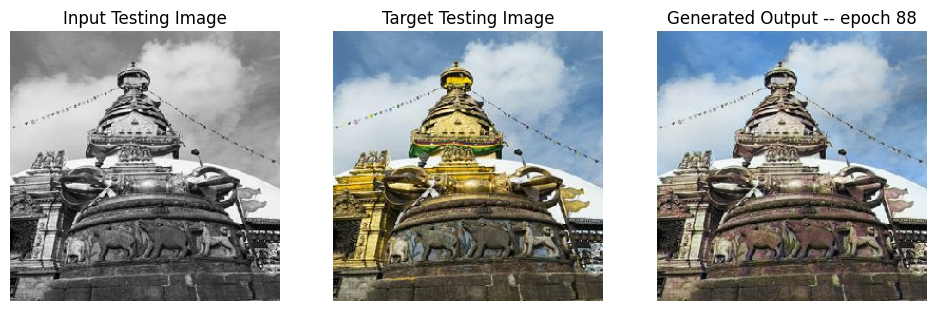

SSIM Score: 0.9687292575836182
PSNR Score: 24.85035514831543
Epoch 88
Training Details
Generator-- total_loss:35.54657 gan_loss:32.85402 l1_loss:0.04134 perceptual_loss:0.00782 Discriminator-- total_loss:0.13417 real_loss:0.06492 generated_loss:0.06925 --- SSIM 0.92883 PSNR 24.41514 LPIPS 0.00000
Time taken for epoch 89 is 404.29111909866333 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.42299 gan_loss:0.07013 l1_loss:0.03601  perceptual_loss:0.00690 Discriminator-- total_loss:8.95476 real_loss:8.89563 generated_loss:0.05913 --- SSIM 0.95211 PSNR 24.94309 LPIPS 0.00000
Time taken for epoch 89 is 497.3435871601105 sec
Number of iteration 140
Epoch 89
Training Details
Generator-- total_loss:35.55892 gan_loss:32.85810 l1_loss:0.04145 perceptual_loss:0.00786 Discriminator-- total_loss:0.02394 real_loss:0.01557 generated_loss:0.00837 --- SSIM 0.92861 PSNR 24.39699 LPIPS 0.00000
Time taken for epoch 90 is 406.8494668006897 sec
Number of iteration 490
Validation Detai

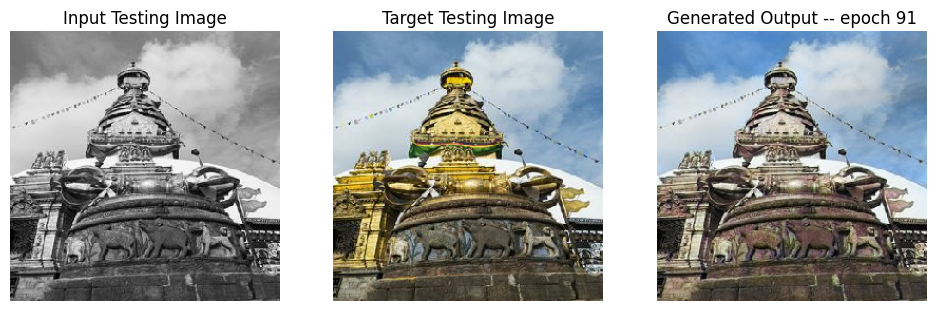

SSIM Score: 0.968719482421875
PSNR Score: 24.834333419799805
Epoch 91
Training Details
Generator-- total_loss:40.70613 gan_loss:37.98590 l1_loss:0.04170 perceptual_loss:0.00794 Discriminator-- total_loss:0.01100 real_loss:0.00881 generated_loss:0.00220 --- SSIM 0.92743 PSNR 24.33360 LPIPS 0.00000
Time taken for epoch 92 is 407.38125705718994 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.43968 gan_loss:0.08378 l1_loss:0.03605  perceptual_loss:0.00692 Discriminator-- total_loss:10.98405 real_loss:10.86567 generated_loss:0.11838 --- SSIM 0.95208 PSNR 24.93513 LPIPS 0.00000
Time taken for epoch 92 is 497.66819620132446 sec
Number of iteration 140
Epoch 92
Training Details
Generator-- total_loss:41.67450 gan_loss:38.98811 l1_loss:0.04126 perceptual_loss:0.00779 Discriminator-- total_loss:0.01526 real_loss:0.01104 generated_loss:0.00421 --- SSIM 0.92871 PSNR 24.43655 LPIPS 0.00000
Time taken for epoch 93 is 405.2919931411743 sec
Number of iteration 490
Validation De

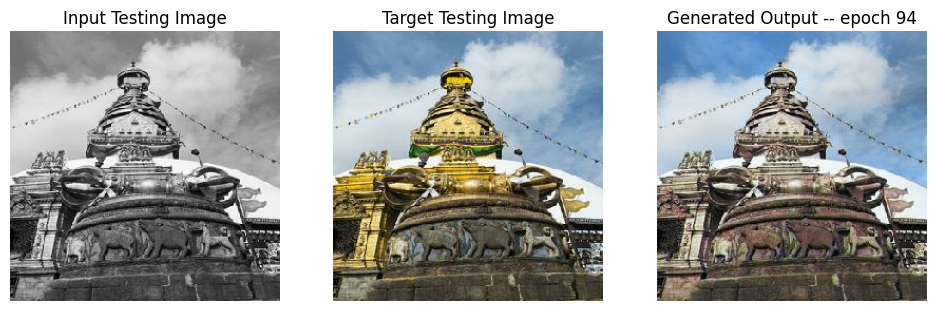

SSIM Score: 0.9686696529388428
PSNR Score: 24.842775344848633
Epoch 94
Training Details
Generator-- total_loss:47.17042 gan_loss:44.46508 l1_loss:0.04154 perceptual_loss:0.00786 Discriminator-- total_loss:0.03236 real_loss:0.01302 generated_loss:0.01934 --- SSIM 0.92809 PSNR 24.36664 LPIPS 0.00000
Time taken for epoch 95 is 390.7698504924774 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.37059 gan_loss:0.01594 l1_loss:0.03603  perceptual_loss:0.00692 Discriminator-- total_loss:11.60159 real_loss:11.52197 generated_loss:0.07962 --- SSIM 0.95211 PSNR 24.94272 LPIPS 0.00000
Time taken for epoch 95 is 480.12182092666626 sec
Number of iteration 140
Epoch 95
Training Details
Generator-- total_loss:46.45010 gan_loss:43.73666 l1_loss:0.04166 perceptual_loss:0.00788 Discriminator-- total_loss:0.00032 real_loss:0.00016 generated_loss:0.00016 --- SSIM 0.92769 PSNR 24.34065 LPIPS 0.00000
Time taken for epoch 96 is 385.60560488700867 sec
Number of iteration 490
Validation D

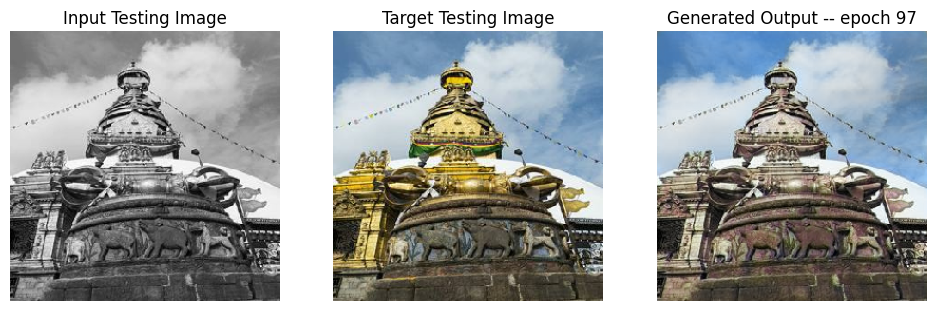

SSIM Score: 0.9687395095825195
PSNR Score: 24.85624122619629
Epoch 97
Training Details
Generator-- total_loss:48.58499 gan_loss:45.90366 l1_loss:0.04116 perceptual_loss:0.00779 Discriminator-- total_loss:0.00003 real_loss:0.00002 generated_loss:0.00001 --- SSIM 0.92919 PSNR 24.43144 LPIPS 0.00000
Time taken for epoch 98 is 385.8255100250244 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.36425 gan_loss:0.01044 l1_loss:0.03602  perceptual_loss:0.00691 Discriminator-- total_loss:11.39899 real_loss:11.37144 generated_loss:0.02755 --- SSIM 0.95212 PSNR 24.94229 LPIPS 0.00000
Time taken for epoch 98 is 475.36569142341614 sec
Number of iteration 140
Epoch 98
Training Details
Generator-- total_loss:48.98372 gan_loss:46.28967 l1_loss:0.04133 perceptual_loss:0.00784 Discriminator-- total_loss:0.00003 real_loss:0.00001 generated_loss:0.00002 --- SSIM 0.92853 PSNR 24.40613 LPIPS 0.00000
Time taken for epoch 99 is 384.8239071369171 sec
Number of iteration 490
Validation Det

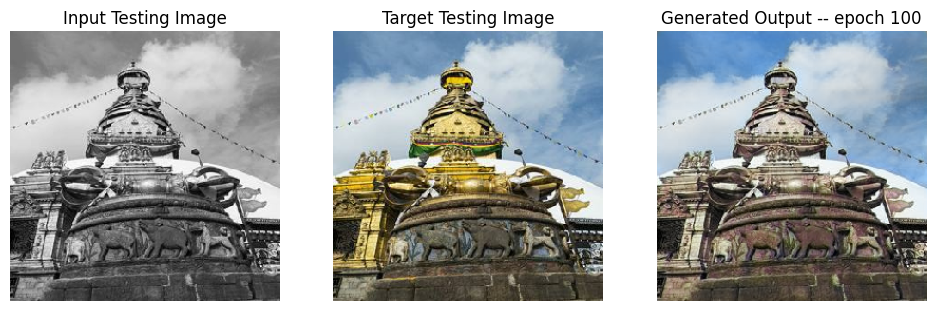

SSIM Score: 0.9687526822090149
PSNR Score: 24.83814239501953
Epoch 100
Training Details
Generator-- total_loss:48.40888 gan_loss:45.71818 l1_loss:0.04126 perceptual_loss:0.00784 Discriminator-- total_loss:0.00016 real_loss:0.00008 generated_loss:0.00007 --- SSIM 0.92878 PSNR 24.41434 LPIPS 0.00000
Time taken for epoch 101 is 389.148060798645 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.37092 gan_loss:0.01882 l1_loss:0.03600  perceptual_loss:0.00690 Discriminator-- total_loss:10.20135 real_loss:10.15676 generated_loss:0.04459 --- SSIM 0.95218 PSNR 24.95081 LPIPS 0.00000
Time taken for epoch 101 is 478.7315585613251 sec
Number of iteration 140
Reduced generator learning rate to 0.0004500000213738531 at epoch 101
Epoch 101
Training Details
Generator-- total_loss:2.94467 gan_loss:0.21238 l1_loss:0.04209 perceptual_loss:0.00785 Discriminator-- total_loss:28.65159 real_loss:28.65158 generated_loss:0.00001 --- SSIM 0.92455 PSNR 24.03180 LPIPS 0.00000
Time taken for 

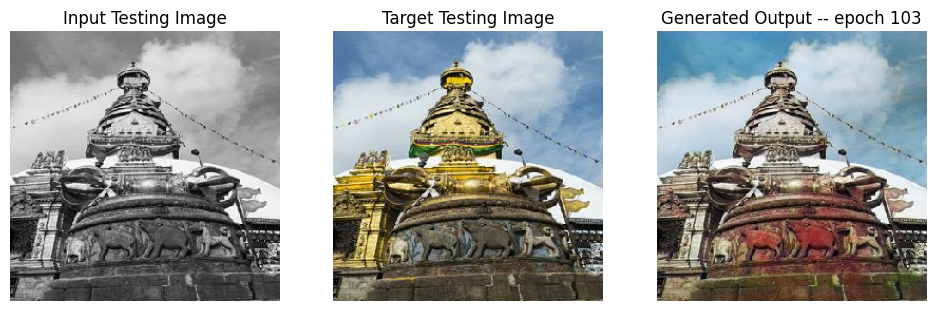

SSIM Score: 0.9614648818969727
PSNR Score: 23.761825561523438
Epoch 103
Training Details
Generator-- total_loss:2.72835 gan_loss:0.00982 l1_loss:0.04198 perceptual_loss:0.00775 Discriminator-- total_loss:27.39886 real_loss:27.39884 generated_loss:0.00002 --- SSIM 0.92439 PSNR 24.17709 LPIPS 0.00000
Time taken for epoch 104 is 520.321455001831 sec
Number of iteration 490
Validation Details
Generator-- total_loss:3.06541 gan_loss:0.00000 l1_loss:0.04701  perceptual_loss:0.00894 Discriminator-- total_loss:41.61223 real_loss:41.61222 generated_loss:0.00001 --- SSIM 0.92978 PSNR 22.79173 LPIPS 0.00000
Time taken for epoch 104 is 610.4741249084473 sec
Number of iteration 140
Epoch 104
Training Details
Generator-- total_loss:2.94016 gan_loss:0.01274 l1_loss:0.04519 perceptual_loss:0.00835 Discriminator-- total_loss:32.64192 real_loss:32.64191 generated_loss:0.00001 --- SSIM 0.91727 PSNR 23.51982 LPIPS 0.00000
Time taken for epoch 105 is 521.5044853687286 sec
Number of iteration 490
Validation

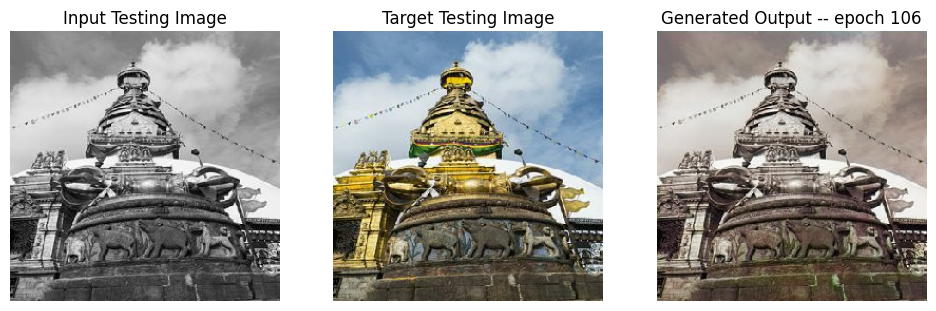

SSIM Score: 0.9615028500556946
PSNR Score: 20.874608993530273
Epoch 106
Training Details
Generator-- total_loss:2.72567 gan_loss:0.00320 l1_loss:0.04197 perceptual_loss:0.00780 Discriminator-- total_loss:25.70455 real_loss:25.70455 generated_loss:0.00000 --- SSIM 0.92561 PSNR 24.16877 LPIPS 0.00000
Time taken for epoch 107 is 517.8673193454742 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.43860 gan_loss:0.00001 l1_loss:0.03746  perceptual_loss:0.00707 Discriminator-- total_loss:31.85512 real_loss:31.85511 generated_loss:0.00001 --- SSIM 0.94914 PSNR 24.61645 LPIPS 0.00000
Time taken for epoch 107 is 609.7266521453857 sec
Number of iteration 140
Epoch 107
Training Details
Generator-- total_loss:2.69355 gan_loss:0.00328 l1_loss:0.04152 perceptual_loss:0.00768 Discriminator-- total_loss:25.61980 real_loss:25.61971 generated_loss:0.00008 --- SSIM 0.92585 PSNR 24.24669 LPIPS 0.00000
Time taken for epoch 108 is 518.5648899078369 sec
Number of iteration 490
Validatio

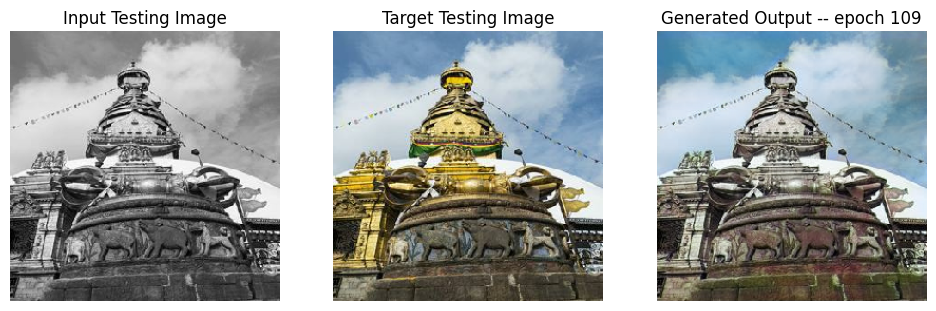

SSIM Score: 0.965599775314331
PSNR Score: 24.041170120239258
Epoch 109
Training Details
Generator-- total_loss:2.77532 gan_loss:0.01075 l1_loss:0.04266 perceptual_loss:0.00790 Discriminator-- total_loss:27.31196 real_loss:27.31193 generated_loss:0.00003 --- SSIM 0.92301 PSNR 24.02575 LPIPS 0.00000
Time taken for epoch 110 is 519.1204423904419 sec
Number of iteration 490
Validation Details
Generator-- total_loss:3.52495 gan_loss:0.00000 l1_loss:0.05249  perceptual_loss:0.01126 Discriminator-- total_loss:33.37825 real_loss:33.37824 generated_loss:0.00001 --- SSIM 0.91766 PSNR 22.10786 LPIPS 0.00000
Time taken for epoch 110 is 609.9610464572906 sec
Number of iteration 140
Epoch 110
Training Details
Generator-- total_loss:2.75020 gan_loss:0.00312 l1_loss:0.04242 perceptual_loss:0.00783 Discriminator-- total_loss:27.80660 real_loss:27.80659 generated_loss:0.00000 --- SSIM 0.92307 PSNR 24.04878 LPIPS 0.00000
Time taken for epoch 111 is 523.2403585910797 sec
Number of iteration 490
Validation

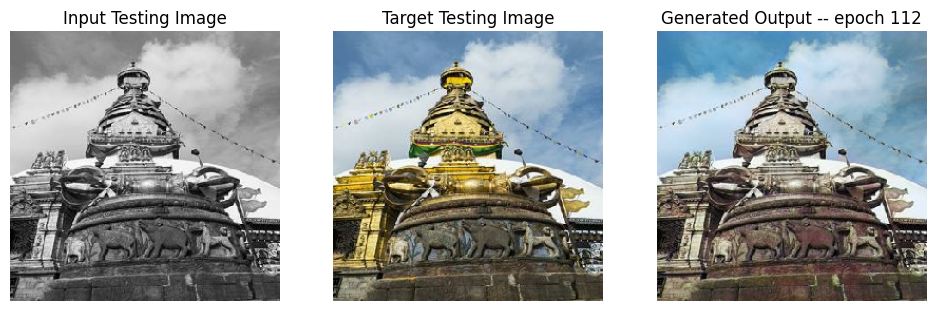

SSIM Score: 0.9670252799987793
PSNR Score: 24.439632415771484
Epoch 112
Training Details
Generator-- total_loss:2.64604 gan_loss:0.00347 l1_loss:0.04078 perceptual_loss:0.00754 Discriminator-- total_loss:25.51365 real_loss:25.51364 generated_loss:0.00002 --- SSIM 0.92723 PSNR 24.39484 LPIPS 0.00000
Time taken for epoch 113 is 521.1197564601898 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.59112 gan_loss:0.00001 l1_loss:0.03961  perceptual_loss:0.00763 Discriminator-- total_loss:26.71258 real_loss:26.71258 generated_loss:0.00001 --- SSIM 0.95024 PSNR 24.27525 LPIPS 0.00000
Time taken for epoch 113 is 613.3566842079163 sec
Number of iteration 140
Epoch 113
Training Details
Generator-- total_loss:2.70060 gan_loss:0.00625 l1_loss:0.04161 perceptual_loss:0.00768 Discriminator-- total_loss:26.15050 real_loss:26.15049 generated_loss:0.00001 --- SSIM 0.92561 PSNR 24.22254 LPIPS 0.00000
Time taken for epoch 114 is 520.7936236858368 sec
Number of iteration 490
Validatio

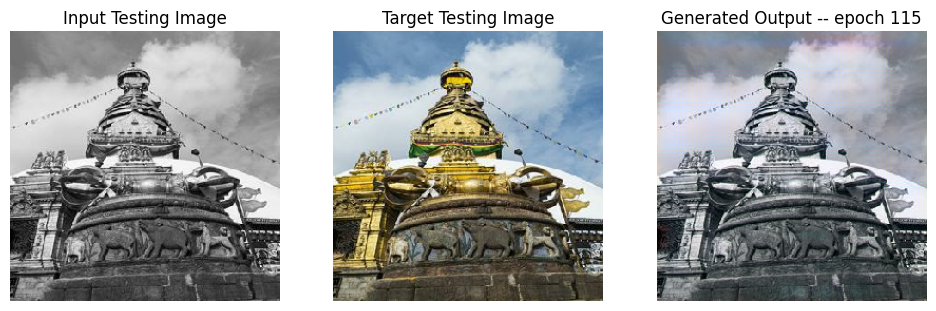

SSIM Score: 0.8912022709846497
PSNR Score: 20.94713592529297
Epoch 115
Training Details
Generator-- total_loss:2.71245 gan_loss:0.00281 l1_loss:0.04187 perceptual_loss:0.00770 Discriminator-- total_loss:25.95373 real_loss:25.95366 generated_loss:0.00007 --- SSIM 0.92445 PSNR 24.17545 LPIPS 0.00000
Time taken for epoch 116 is 522.7655143737793 sec
Number of iteration 490
Validation Details
Generator-- total_loss:3.60710 gan_loss:0.00002 l1_loss:0.05110  perceptual_loss:0.01315 Discriminator-- total_loss:17.48104 real_loss:17.48103 generated_loss:0.00001 --- SSIM 0.94337 PSNR 22.36256 LPIPS 0.00000
Time taken for epoch 116 is 613.5892953872681 sec
Number of iteration 140
Epoch 116
Training Details
Generator-- total_loss:2.67430 gan_loss:0.00202 l1_loss:0.04125 perceptual_loss:0.00762 Discriminator-- total_loss:25.47893 real_loss:25.47891 generated_loss:0.00002 --- SSIM 0.92655 PSNR 24.28986 LPIPS 0.00000
Time taken for epoch 117 is 520.4823718070984 sec
Number of iteration 490
Validation

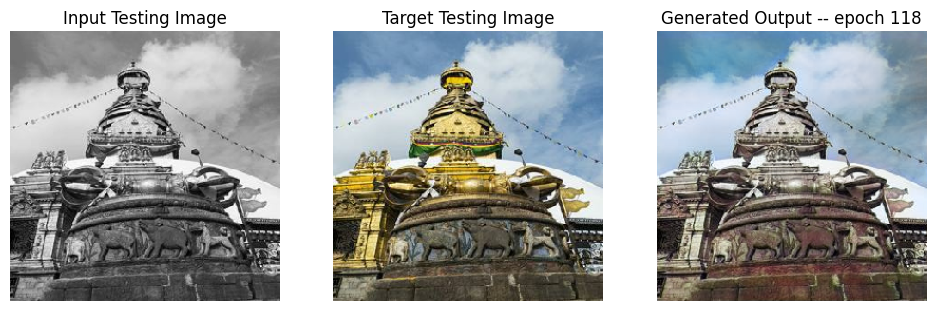

SSIM Score: 0.9660756587982178
PSNR Score: 24.020606994628906
Epoch 118
Training Details
Generator-- total_loss:2.92519 gan_loss:0.01207 l1_loss:0.04499 perceptual_loss:0.00829 Discriminator-- total_loss:31.03656 real_loss:31.00212 generated_loss:0.03444 --- SSIM 0.91927 PSNR 23.55454 LPIPS 0.00000
Time taken for epoch 119 is 520.4364082813263 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.60291 gan_loss:0.00000 l1_loss:0.03911  perceptual_loss:0.00809 Discriminator-- total_loss:25.59286 real_loss:25.59285 generated_loss:0.00001 --- SSIM 0.94962 PSNR 24.34845 LPIPS 0.00000
Time taken for epoch 119 is 611.9894845485687 sec
Number of iteration 140
Epoch 119
Training Details
Generator-- total_loss:2.66820 gan_loss:0.00409 l1_loss:0.04116 perceptual_loss:0.00758 Discriminator-- total_loss:24.33498 real_loss:24.33495 generated_loss:0.00003 --- SSIM 0.92651 PSNR 24.34460 LPIPS 0.00000
Time taken for epoch 120 is 521.4091410636902 sec
Number of iteration 490
Validatio

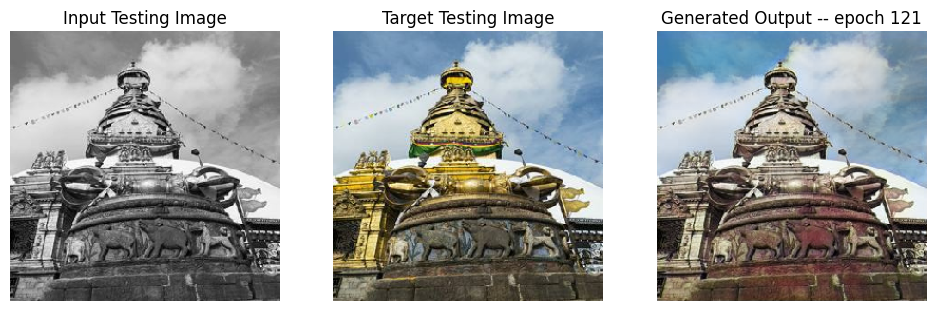

SSIM Score: 0.9665104746818542
PSNR Score: 24.769596099853516
Epoch 121
Training Details
Generator-- total_loss:2.64954 gan_loss:0.00241 l1_loss:0.04088 perceptual_loss:0.00754 Discriminator-- total_loss:23.90398 real_loss:23.90349 generated_loss:0.00049 --- SSIM 0.92562 PSNR 24.36424 LPIPS 0.00000
Time taken for epoch 122 is 518.0500543117523 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.42985 gan_loss:0.00001 l1_loss:0.03751  perceptual_loss:0.00693 Discriminator-- total_loss:30.95811 real_loss:30.95810 generated_loss:0.00001 --- SSIM 0.94820 PSNR 24.61299 LPIPS 0.00000
Time taken for epoch 122 is 608.5375916957855 sec
Number of iteration 140
Epoch 122
Training Details
Generator-- total_loss:2.61958 gan_loss:0.00283 l1_loss:0.04043 perceptual_loss:0.00744 Discriminator-- total_loss:24.33815 real_loss:24.33709 generated_loss:0.00106 --- SSIM 0.92748 PSNR 24.50313 LPIPS 0.00000
Time taken for epoch 123 is 519.0374896526337 sec
Number of iteration 490
Validatio

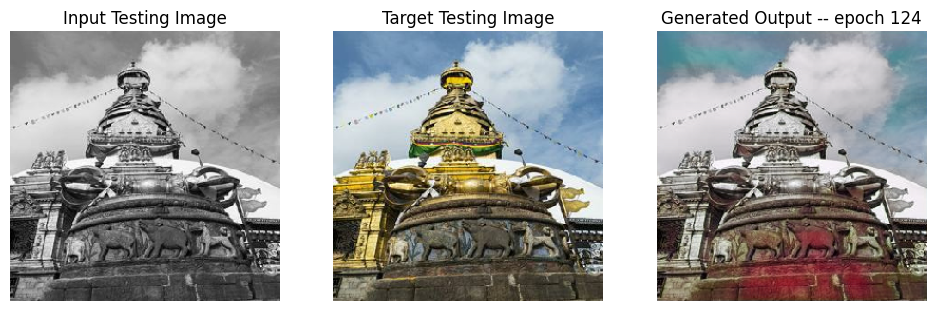

SSIM Score: 0.957409679889679
PSNR Score: 22.34679412841797
Epoch 124
Training Details
Generator-- total_loss:2.61753 gan_loss:0.00231 l1_loss:0.04041 perceptual_loss:0.00743 Discriminator-- total_loss:24.53373 real_loss:24.53372 generated_loss:0.00001 --- SSIM 0.92779 PSNR 24.47168 LPIPS 0.00000
Time taken for epoch 125 is 515.3764524459839 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.51761 gan_loss:0.00001 l1_loss:0.03895  perceptual_loss:0.00713 Discriminator-- total_loss:30.54955 real_loss:30.54954 generated_loss:0.00001 --- SSIM 0.94725 PSNR 24.26226 LPIPS 0.00000
Time taken for epoch 125 is 604.2202620506287 sec
Number of iteration 140
Epoch 125
Training Details
Generator-- total_loss:2.61427 gan_loss:0.00235 l1_loss:0.04038 perceptual_loss:0.00741 Discriminator-- total_loss:24.81485 real_loss:24.81484 generated_loss:0.00001 --- SSIM 0.92689 PSNR 24.48586 LPIPS 0.00000
Time taken for epoch 126 is 518.2087111473083 sec
Number of iteration 490
Validation 

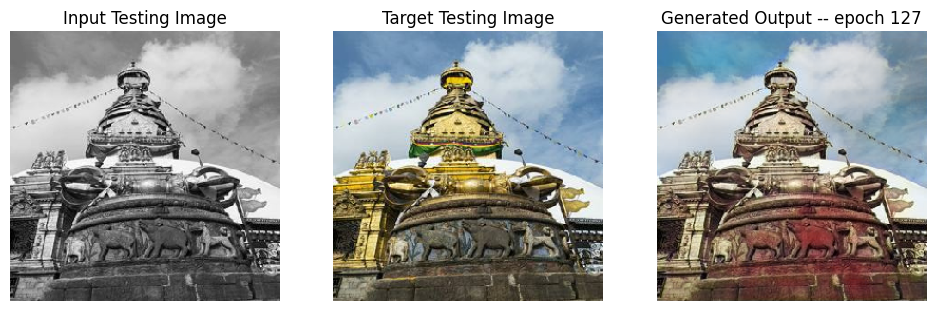

SSIM Score: 0.9642408490180969
PSNR Score: 24.436138153076172
Epoch 127
Training Details
Generator-- total_loss:2.59051 gan_loss:0.00236 l1_loss:0.04003 perceptual_loss:0.00733 Discriminator-- total_loss:24.44287 real_loss:24.44270 generated_loss:0.00018 --- SSIM 0.92835 PSNR 24.62329 LPIPS 0.00000
Time taken for epoch 128 is 519.2644670009613 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.39597 gan_loss:0.00001 l1_loss:0.03649  perceptual_loss:0.00715 Discriminator-- total_loss:27.43987 real_loss:27.43986 generated_loss:0.00001 --- SSIM 0.95083 PSNR 24.84283 LPIPS 0.00000
Time taken for epoch 128 is 609.0251085758209 sec
Number of iteration 140
Reduced discriminator learning rate to 0.0003000000142492354 at epoch 128.
Epoch 128
Training Details
Generator-- total_loss:18.95485 gan_loss:16.35885 l1_loss:0.04009 perceptual_loss:0.00740 Discriminator-- total_loss:0.20952 real_loss:0.09719 generated_loss:0.11233 --- SSIM 0.92649 PSNR 24.57883 LPIPS 0.00000
Time tak

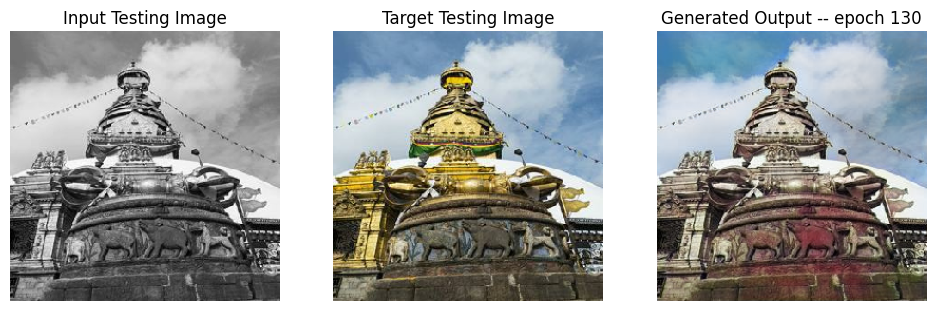

SSIM Score: 0.9659367203712463
PSNR Score: 24.575666427612305
Epoch 130
Training Details
Generator-- total_loss:19.67033 gan_loss:17.06574 l1_loss:0.04017 perceptual_loss:0.00745 Discriminator-- total_loss:0.06522 real_loss:0.03300 generated_loss:0.03223 --- SSIM 0.92571 PSNR 24.57427 LPIPS 0.00000
Time taken for epoch 131 is 384.9098873138428 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.48308 gan_loss:0.08638 l1_loss:0.03676  perceptual_loss:0.00699 Discriminator-- total_loss:5.03764 real_loss:4.96243 generated_loss:0.07521 --- SSIM 0.94812 PSNR 24.78230 LPIPS 0.00000
Time taken for epoch 131 is 474.69887804985046 sec
Number of iteration 140
Epoch 131
Training Details
Generator-- total_loss:18.91930 gan_loss:16.34385 l1_loss:0.03977 perceptual_loss:0.00734 Discriminator-- total_loss:0.05813 real_loss:0.02395 generated_loss:0.03418 --- SSIM 0.92714 PSNR 24.66207 LPIPS 0.00000
Time taken for epoch 132 is 384.6056797504425 sec
Number of iteration 490
Validation

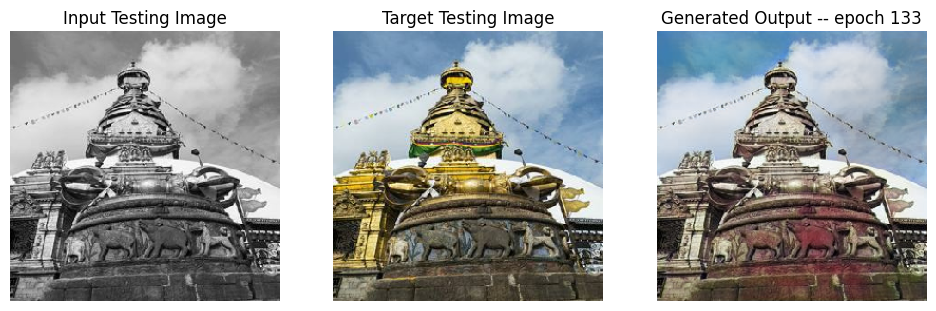

SSIM Score: 0.9658102989196777
PSNR Score: 24.56836700439453
Epoch 133
Training Details
Generator-- total_loss:18.50432 gan_loss:15.93223 l1_loss:0.03971 perceptual_loss:0.00733 Discriminator-- total_loss:0.06775 real_loss:0.02104 generated_loss:0.04671 --- SSIM 0.92746 PSNR 24.66487 LPIPS 0.00000
Time taken for epoch 134 is 383.3076696395874 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.41487 gan_loss:0.01604 l1_loss:0.03681  perceptual_loss:0.00698 Discriminator-- total_loss:8.32373 real_loss:8.31003 generated_loss:0.01371 --- SSIM 0.94794 PSNR 24.76959 LPIPS 0.00000
Time taken for epoch 134 is 473.55609011650085 sec
Number of iteration 140
Epoch 134
Training Details
Generator-- total_loss:15.60797 gan_loss:13.05325 l1_loss:0.03948 perceptual_loss:0.00726 Discriminator-- total_loss:0.12170 real_loss:0.04451 generated_loss:0.07720 --- SSIM 0.92812 PSNR 24.71951 LPIPS 0.00000
Time taken for epoch 135 is 385.9232954978943 sec
Number of iteration 490
Validation 

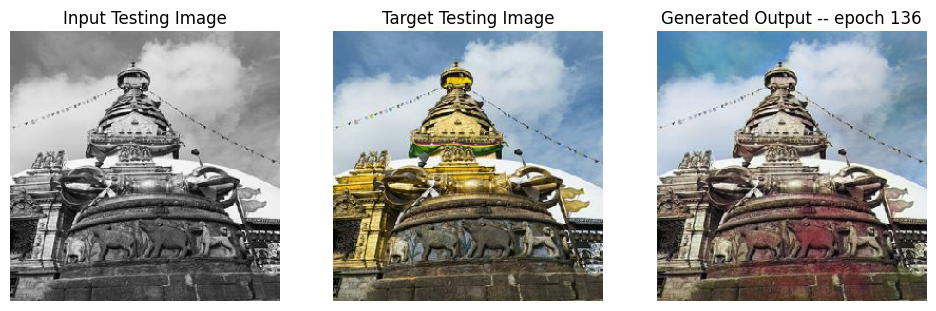

SSIM Score: 0.9657238125801086
PSNR Score: 24.556934356689453
Epoch 136
Training Details
Generator-- total_loss:16.79001 gan_loss:14.20270 l1_loss:0.03997 perceptual_loss:0.00736 Discriminator-- total_loss:0.00897 real_loss:0.00375 generated_loss:0.00522 --- SSIM 0.92613 PSNR 24.60481 LPIPS 0.00000
Time taken for epoch 137 is 385.2361011505127 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.50588 gan_loss:0.10943 l1_loss:0.03676  perceptual_loss:0.00698 Discriminator-- total_loss:4.04672 real_loss:3.96540 generated_loss:0.08132 --- SSIM 0.94802 PSNR 24.78169 LPIPS 0.00000
Time taken for epoch 137 is 474.0988459587097 sec
Number of iteration 140
Epoch 137
Training Details
Generator-- total_loss:16.71741 gan_loss:14.14176 l1_loss:0.03980 perceptual_loss:0.00732 Discriminator-- total_loss:0.04231 real_loss:0.01652 generated_loss:0.02580 --- SSIM 0.92690 PSNR 24.66224 LPIPS 0.00000
Time taken for epoch 138 is 385.00070786476135 sec
Number of iteration 490
Validation

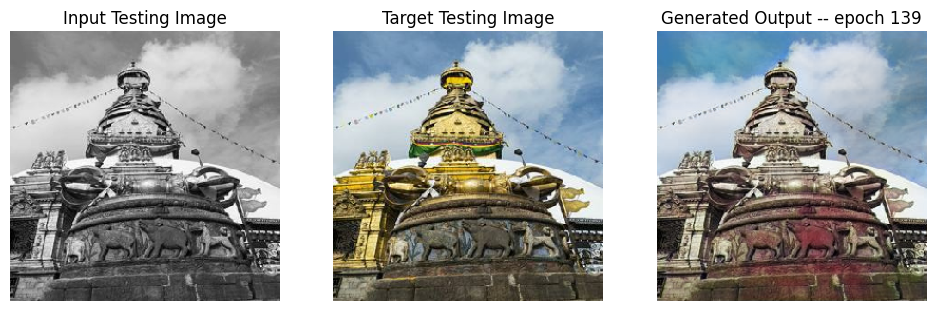

SSIM Score: 0.9656971096992493
PSNR Score: 24.55512046813965
Epoch 139
Training Details
Generator-- total_loss:16.60339 gan_loss:14.03066 l1_loss:0.03974 perceptual_loss:0.00732 Discriminator-- total_loss:0.01402 real_loss:0.00632 generated_loss:0.00770 --- SSIM 0.92664 PSNR 24.64860 LPIPS 0.00000
Time taken for epoch 140 is 385.7877628803253 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.50262 gan_loss:0.10374 l1_loss:0.03682  perceptual_loss:0.00698 Discriminator-- total_loss:4.61114 real_loss:4.54318 generated_loss:0.06797 --- SSIM 0.94792 PSNR 24.76553 LPIPS 0.00000
Time taken for epoch 140 is 474.1127333641052 sec
Number of iteration 140
Epoch 140
Training Details
Generator-- total_loss:18.32231 gan_loss:15.72725 l1_loss:0.04010 perceptual_loss:0.00737 Discriminator-- total_loss:0.00752 real_loss:0.00369 generated_loss:0.00383 --- SSIM 0.92643 PSNR 24.60989 LPIPS 0.00000
Time taken for epoch 141 is 384.44455790519714 sec
Number of iteration 490
Validation 

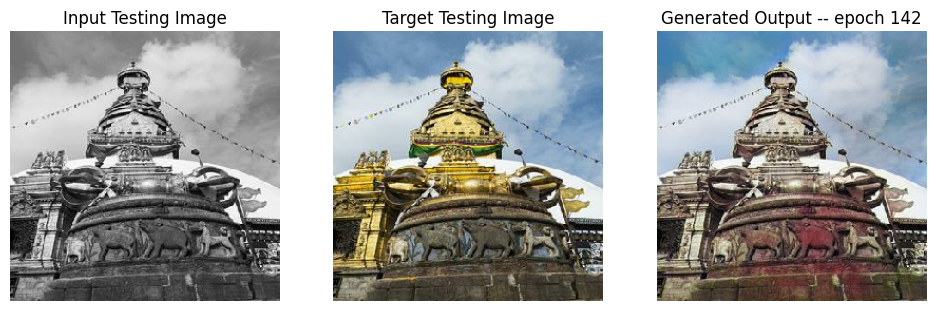

SSIM Score: 0.9659562706947327
PSNR Score: 24.579492568969727
Epoch 142
Training Details
Generator-- total_loss:17.94859 gan_loss:15.37939 l1_loss:0.03966 perceptual_loss:0.00733 Discriminator-- total_loss:0.01954 real_loss:0.00751 generated_loss:0.01204 --- SSIM 0.92719 PSNR 24.68126 LPIPS 0.00000
Time taken for epoch 143 is 383.9101049900055 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.85634 gan_loss:0.45879 l1_loss:0.03678  perceptual_loss:0.00698 Discriminator-- total_loss:5.55746 real_loss:5.10772 generated_loss:0.44974 --- SSIM 0.94807 PSNR 24.77257 LPIPS 0.00000
Time taken for epoch 143 is 472.26904010772705 sec
Number of iteration 140
Epoch 143
Training Details
Generator-- total_loss:18.93215 gan_loss:16.35647 l1_loss:0.03981 perceptual_loss:0.00732 Discriminator-- total_loss:0.01443 real_loss:0.00653 generated_loss:0.00790 --- SSIM 0.92648 PSNR 24.67433 LPIPS 0.00000
Time taken for epoch 144 is 385.73754262924194 sec
Number of iteration 490
Validatio

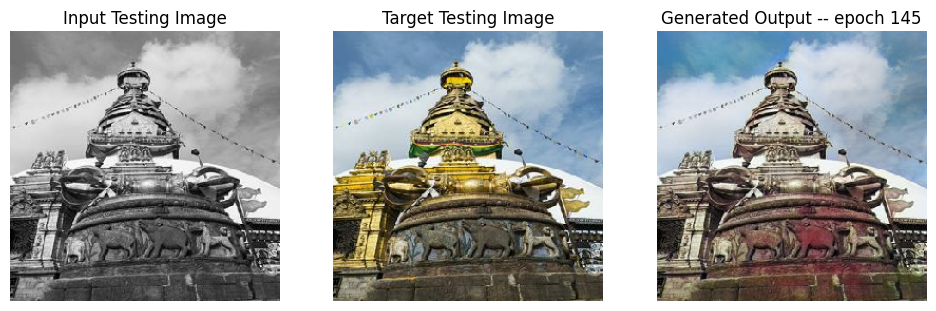

SSIM Score: 0.9659660458564758
PSNR Score: 24.586158752441406
Epoch 145
Training Details
Generator-- total_loss:18.73406 gan_loss:16.17984 l1_loss:0.03940 perceptual_loss:0.00730 Discriminator-- total_loss:0.05513 real_loss:0.01882 generated_loss:0.03630 --- SSIM 0.92774 PSNR 24.70707 LPIPS 0.00000
Time taken for epoch 146 is 386.5477430820465 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.49464 gan_loss:0.09874 l1_loss:0.03676  perceptual_loss:0.00697 Discriminator-- total_loss:4.63467 real_loss:4.55862 generated_loss:0.07606 --- SSIM 0.94809 PSNR 24.77816 LPIPS 0.00000
Time taken for epoch 146 is 475.0856785774231 sec
Number of iteration 140
Epoch 146
Training Details
Generator-- total_loss:17.96927 gan_loss:15.38013 l1_loss:0.03993 perceptual_loss:0.00741 Discriminator-- total_loss:0.02279 real_loss:0.00982 generated_loss:0.01297 --- SSIM 0.92667 PSNR 24.62717 LPIPS 0.00000
Time taken for epoch 147 is 387.68201327323914 sec
Number of iteration 490
Validation

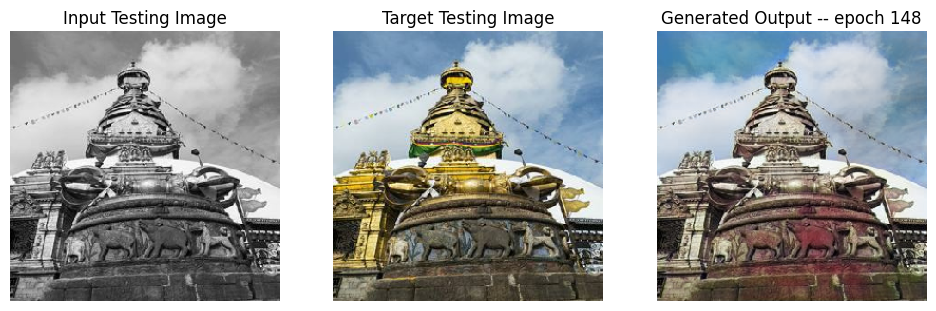

SSIM Score: 0.9658464789390564
PSNR Score: 24.571630477905273


In [48]:
fit(train_dataset, epochs, validation_dataset, gen)

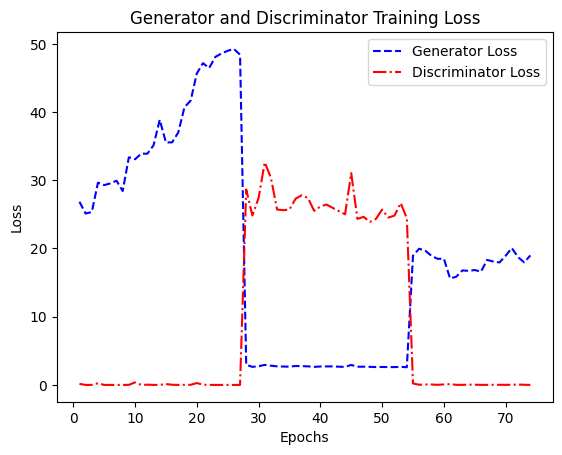

In [49]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

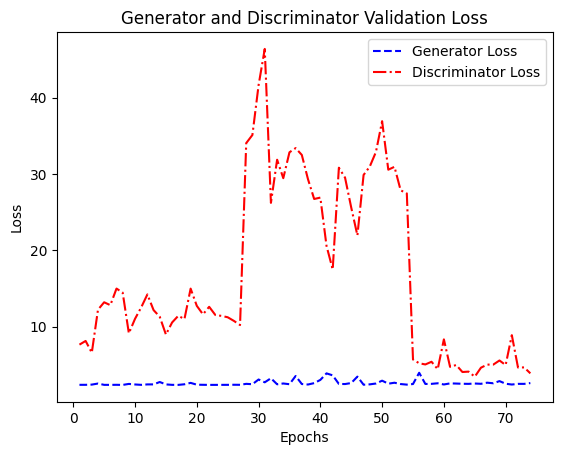

In [50]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

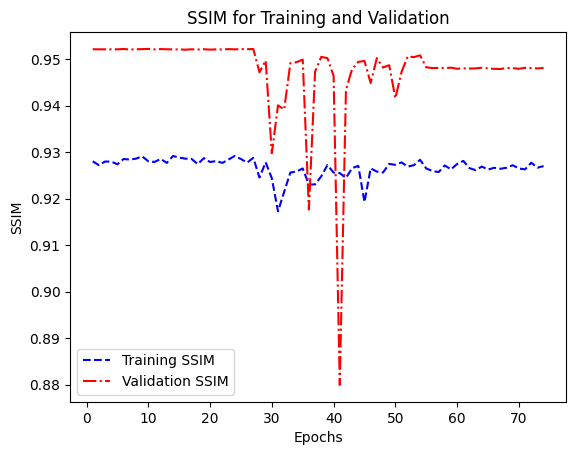

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.r', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

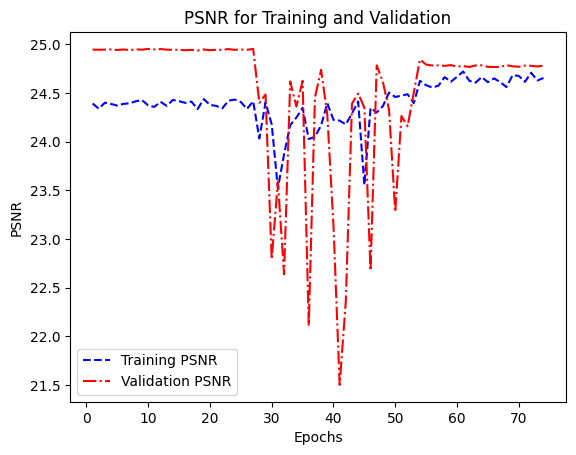

In [52]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.r', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

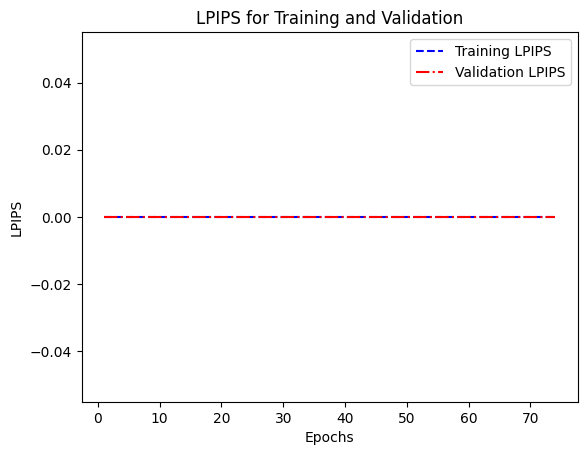

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.r', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

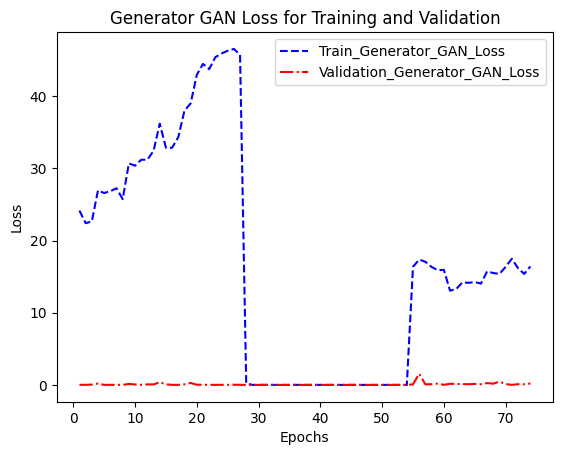

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses, '-.r', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

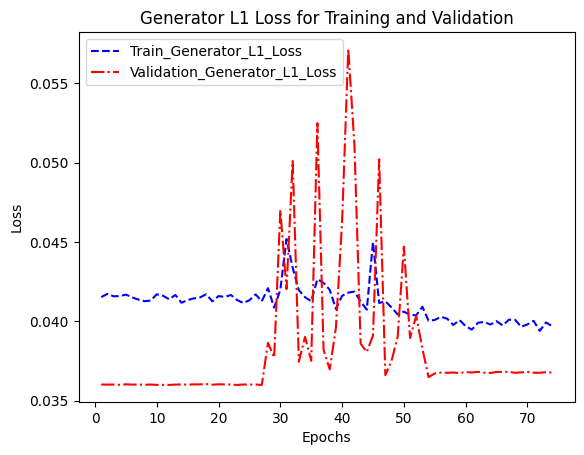

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.r', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

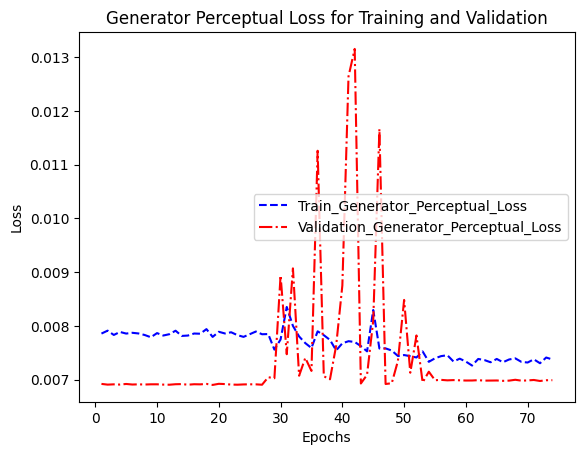

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.r', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

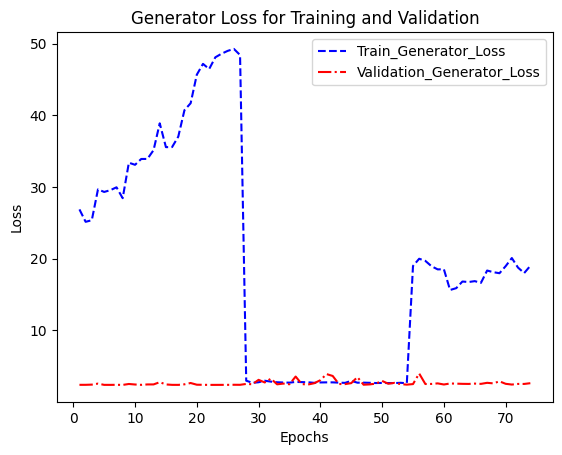

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.r', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

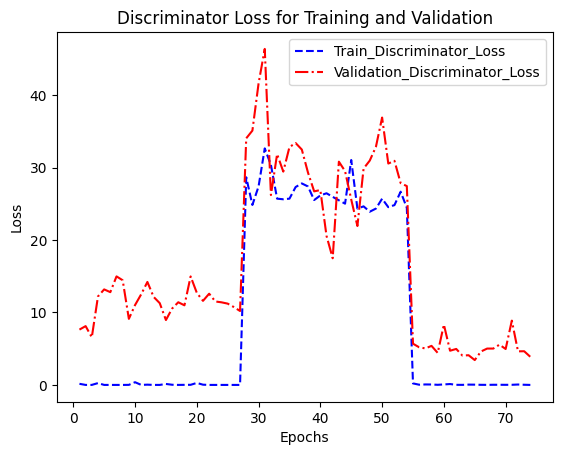

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

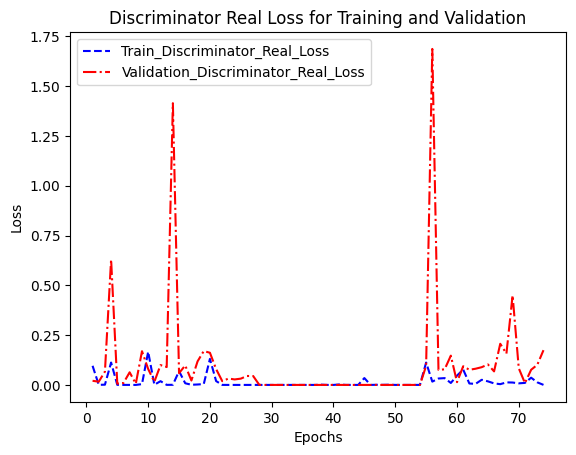

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.r', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

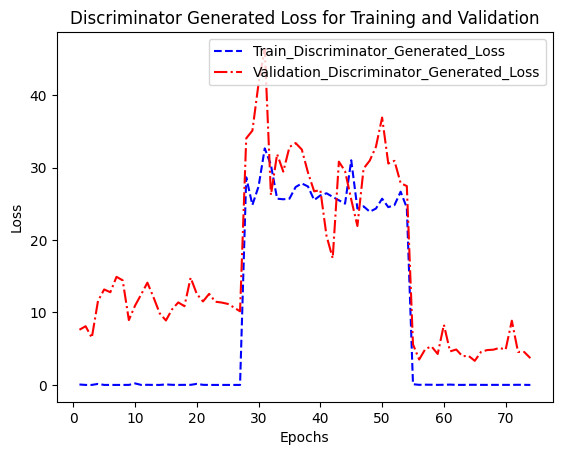

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses, '-.r', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [61]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [62]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [63]:
os.mkdir('/kaggle/working/modelsFeb7')

In [64]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_weight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [65]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [66]:
import subprocess
from IPython.display import FileLink, display

In [67]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip